In [22]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer
from sklearn.preprocessing import scale
import matplotlib.pyplot as plt
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import sklearn.metrics as metrics

import warnings
warnings.filterwarnings("ignore")

In [23]:
df = pd.read_csv("Data.csv")

In [24]:
df.head()

,applicant_id,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,...,smoking_status,Year_last_admitted,Location,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost
0,5000,3,1,1,Salried,2,125 to 150,4866,28,1,...,Unknown,NaN,Chennai,67,N,Rare,Moderate,1,25,20978
1,5001,0,0,0,Student,4,150 to 175,6411,50,0,...,formerly smoked,NaN,Jaipur,58,N,Rare,Moderate,3,27,6170
2,5002,1,0,0,Business,4,200 to 225,4509,68,0,...,formerly smoked,NaN,Jaipur,73,N,Daily,Extreme,0,32,28382
3,5003,7,4,0,Business,2,175 to 200,6214,51,0,...,Unknown,NaN,Chennai,71,Y,Rare,No,3,37,27148
4,5004,3,1,0,Student,2,150 to 175,4938,44,0,...,never smoked,2004.00,Bangalore,74,N,No,Extreme,0,34,29616


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   applicant_id                    25000 non-null  int64  
 1   years_of_insurance_with_us      25000 non-null  int64  
 2   regular_checkup_lasy_year       25000 non-null  int64  
 3   adventure_sports                25000 non-null  int64  
 4   Occupation                      25000 non-null  object 
 5   visited_doctor_last_1_year      25000 non-null  int64  
 6   cholesterol_level               25000 non-null  object 
 7   daily_avg_steps                 25000 non-null  int64  
 8   age                             25000 non-null  int64  
 9   heart_decs_history              25000 non-null  int64  
 10  other_major_decs_history        25000 non-null  int64  
 11  Gender                          25000 non-null  object 
 12  avg_glucose_level               

In [26]:
# Checking the duplicated rows
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [27]:
# Printing the data statistics by formatting it to 2 decimal places
pd.options.display.float_format = '{:.2f}'.format   
df.describe()

,applicant_id,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,visited_doctor_last_1_year,daily_avg_steps,age,heart_decs_history,other_major_decs_history,avg_glucose_level,bmi,Year_last_admitted,weight,weight_change_in_last_one_year,fat_percentage,insurance_cost
count,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,24010.00,13119.00,25000.00,25000.00,25000.00,25000.00
mean,17499.50,4.09,0.77,0.08,3.10,5215.89,44.92,0.05,0.10,167.53,31.39,2003.89,71.61,2.52,28.81,27147.41
std,7217.02,2.61,1.20,0.27,1.14,1053.18,16.11,0.23,0.30,62.73,7.88,7.58,9.33,1.69,8.63,14323.69
min,5000.00,0.00,0.00,0.00,0.00,2034.00,16.00,0.00,0.00,57.00,12.30,1990.00,52.00,0.00,11.00,2468.00
25%,11249.75,2.00,0.00,0.00,2.00,4543.00,31.00,0.00,0.00,113.00,26.10,1997.00,64.00,1.00,21.00,16042.00
50%,17499.50,4.00,0.00,0.00,3.00,5089.00,45.00,0.00,0.00,168.00,30.50,2004.00,72.00,3.00,31.00,27148.00
75%,23749.25,6.00,1.00,0.00,4.00,5730.00,59.00,0.00,0.00,222.00,35.60,2010.00,78.00,4.00,36.00,37020.00
max,29999.00,8.00,5.00,1.00,12.00,11255.00,74.00,1.00,1.00,277.00,100.60,2018.00,96.00,6.00,42.00,67870.00


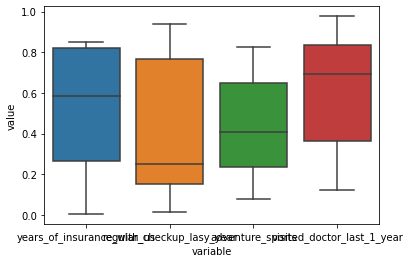

In [18]:
df = pd.DataFrame(data = np.random.random(size=(12,4)), columns = ['years_of_insurance_with_us','regular_checkup_lasy_year','adventure_sports','visited_doctor_last_1_year'])

sns.boxplot(x="variable", y="value", data=pd.melt(df))

plt.show()

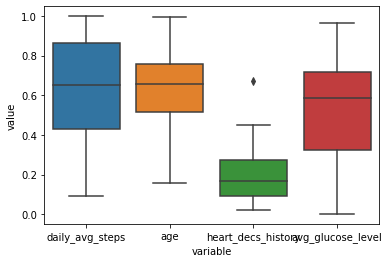

In [19]:
df = pd.DataFrame(data = np.random.random(size=(12,4)), columns = ['daily_avg_steps','age','heart_decs_history','avg_glucose_level'])

sns.boxplot(x="variable", y="value", data=pd.melt(df))

plt.show()

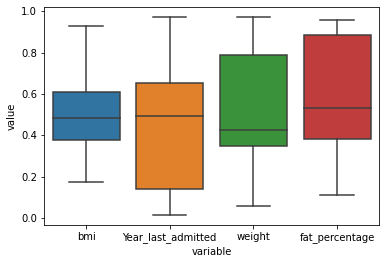

In [20]:
df = pd.DataFrame(data = np.random.random(size=(12,4)), columns = ['bmi','Year_last_admitted','weight','fat_percentage'])

sns.boxplot(x="variable", y="value", data=pd.melt(df))

plt.show()

In [28]:
# dropping applicant_id, as they are unique and does not play any part in predictions
df1 = df.drop(['applicant_id'], axis = 1)

In [29]:
#Transforming the categorical values to numerical 
cleanup_nums = {"Occupation":     {"Salried": 1, "Business": 2,"Student": 3},
                "cholesterol_level": {"125 to 150": 1, "150 to 175": 2, "175 to 200": 3, "200 to 225": 4,"225 to 250": 5},
                "Gender":     {"Male": 1, "Female": 2},
                "smoking_status":     {"formerly smoked": 1, "never smoked": 2,"smokes": 3,"Unknown": 4},
                "exercise":     {"Extreme": 1, "Moderate": 2,"No": 3},
                "Alcohol":     {"Daily": 1, "Rare": 2,"No": 3},
                "covered_by_any_other_company":     {"Y": 1, "N": 2}
               }

In [30]:
df1 = df1.replace(cleanup_nums)

In [31]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   Occupation                      25000 non-null  int64  
 4   visited_doctor_last_1_year      25000 non-null  int64  
 5   cholesterol_level               25000 non-null  int64  
 6   daily_avg_steps                 25000 non-null  int64  
 7   age                             25000 non-null  int64  
 8   heart_decs_history              25000 non-null  int64  
 9   other_major_decs_history        25000 non-null  int64  
 10  Gender                          25000 non-null  int64  
 11  avg_glucose_level               25000 non-null  int64  
 12  bmi                             

In [32]:
#Checking the null values count
df.isnull().sum()

applicant_id                          0
years_of_insurance_with_us            0
regular_checkup_lasy_year             0
adventure_sports                      0
Occupation                            0
visited_doctor_last_1_year            0
cholesterol_level                     0
daily_avg_steps                       0
age                                   0
heart_decs_history                    0
other_major_decs_history              0
Gender                                0
avg_glucose_level                     0
bmi                                 990
smoking_status                        0
Year_last_admitted                11881
Location                              0
weight                                0
covered_by_any_other_company          0
Alcohol                               0
exercise                              0
weight_change_in_last_one_year        0
fat_percentage                        0
insurance_cost                        0
dtype: int64

In [33]:
# Drop column Year_last_admitted  as it has 11881 null values, which is 48% of Null values
df2 = df1.drop(['Year_last_admitted'], axis = 1)

In [34]:
# Setting the outlier range 
Q1 = df2.quantile(0.25)
Q3 = df2.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [35]:
# Checking how many values are in the outlier range
((df2 > UL) | (df2 < LL)).sum()

Alcohol                               0
Gender                                0
Location                              0
Occupation                            0
adventure_sports                   2043
age                                   0
avg_glucose_level                     0
bmi                                 549
cholesterol_level                     0
covered_by_any_other_company          0
daily_avg_steps                     952
exercise                          10362
fat_percentage                        0
heart_decs_history                 1366
insurance_cost                        0
other_major_decs_history           2454
regular_checkup_lasy_year          2943
smoking_status                        0
visited_doctor_last_1_year           96
weight                                0
weight_change_in_last_one_year        0
years_of_insurance_with_us            0
dtype: int64

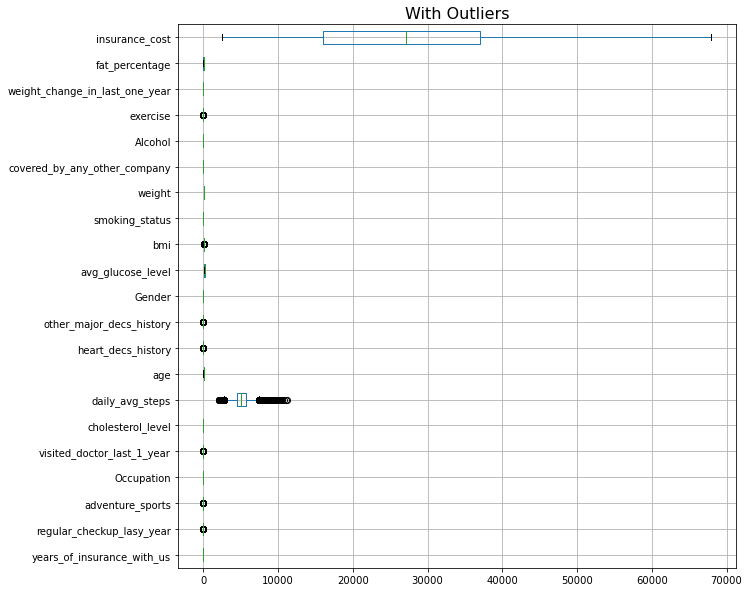

In [36]:
# construct box plot for all continuous variables for visualizing the outliers
plt.figure(figsize=(10,10))
df2.boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [37]:
# Updating all the Outliers to NaN, so that they can be imputed using KNN Imputer later
df2.loc[df2["daily_avg_steps"] > 7510, "daily_avg_steps"] = np.nan

In [38]:
# Updating all the Outliers to NaN, so that they can be imputed using KNN Imputer later
df2.loc[df2["daily_avg_steps"] < 2762, "daily_avg_steps"] = np.nan

In [39]:
#Checking the null values count again
df2.isnull().sum()

years_of_insurance_with_us          0
regular_checkup_lasy_year           0
adventure_sports                    0
Occupation                          0
visited_doctor_last_1_year          0
cholesterol_level                   0
daily_avg_steps                   951
age                                 0
heart_decs_history                  0
other_major_decs_history            0
Gender                              0
avg_glucose_level                   0
bmi                               990
smoking_status                      0
Location                            0
weight                              0
covered_by_any_other_company        0
Alcohol                             0
exercise                            0
weight_change_in_last_one_year      0
fat_percentage                      0
insurance_cost                      0
dtype: int64

In [40]:
loc = df1["Location"]

In [41]:
loc.to_frame()

,Location
0,Chennai
1,Jaipur
2,Jaipur
3,Chennai
4,Bangalore
...,...
24995,Kanpur
24996,Kanpur
24997,Bhubaneswar
24998,Surat


In [42]:
# Temporary removing location, as all others are numeric fields now. After KNN imputation we will add it later
df3 = df2.drop(['Location'], axis = 1)

In [43]:
# Imputing the Null values with KNN Imputer
imputer = KNNImputer(n_neighbors=50)
health_imputed_df = pd.DataFrame(imputer.fit_transform(df3), columns = df3.columns)

In [44]:
df4 = health_imputed_df

In [45]:
# Adding back 
health_imputed_df["Location"]= loc

In [46]:
health_imputed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  float64
 1   regular_checkup_lasy_year       25000 non-null  float64
 2   adventure_sports                25000 non-null  float64
 3   Occupation                      25000 non-null  float64
 4   visited_doctor_last_1_year      25000 non-null  float64
 5   cholesterol_level               25000 non-null  float64
 6   daily_avg_steps                 25000 non-null  float64
 7   age                             25000 non-null  float64
 8   heart_decs_history              25000 non-null  float64
 9   other_major_decs_history        25000 non-null  float64
 10  Gender                          25000 non-null  float64
 11  avg_glucose_level               25000 non-null  float64
 12  bmi                             

In [47]:
# Printing the data statistics by formatting it to 2 decimal places
pd.options.display.float_format = '{:.2f}'.format   
health_imputed_df.describe()

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,...,avg_glucose_level,bmi,smoking_status,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost
count,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,...,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00
mean,4.09,0.77,0.08,2.21,3.10,2.27,5113.31,44.92,0.05,0.10,...,167.53,31.39,2.59,71.61,1.70,2.23,1.99,2.52,28.81,27147.41
std,2.61,1.20,0.27,0.74,1.14,1.26,853.54,16.11,0.23,0.30,...,62.73,7.72,1.09,9.33,0.46,0.63,0.64,1.69,8.63,14323.69
min,0.00,0.00,0.00,1.00,0.00,1.00,2762.00,16.00,0.00,0.00,...,57.00,12.30,1.00,52.00,1.00,1.00,1.00,0.00,11.00,2468.00
25%,2.00,0.00,0.00,2.00,2.00,1.00,4552.00,31.00,0.00,0.00,...,113.00,26.30,2.00,64.00,1.00,2.00,2.00,1.00,21.00,16042.00
50%,4.00,0.00,0.00,2.00,3.00,2.00,5067.00,45.00,0.00,0.00,...,168.00,30.60,2.00,72.00,2.00,2.00,2.00,3.00,31.00,27148.00
75%,6.00,1.00,0.00,3.00,4.00,3.00,5616.25,59.00,0.00,0.00,...,222.00,35.30,4.00,78.00,2.00,3.00,2.00,4.00,36.00,37020.00
max,8.00,5.00,1.00,3.00,12.00,5.00,7508.00,74.00,1.00,1.00,...,277.00,100.60,4.00,96.00,2.00,3.00,3.00,6.00,42.00,67870.00


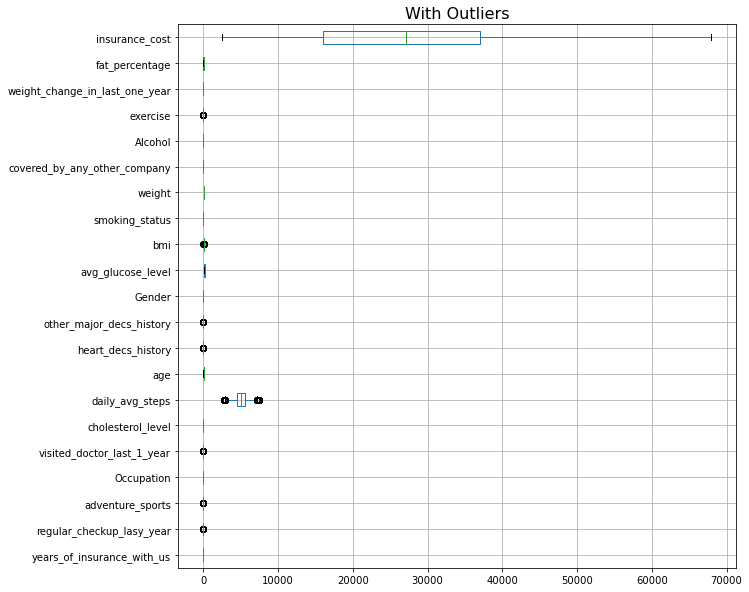

In [48]:
# construct box plot for all continuous variables for visualizing the outliers
plt.figure(figsize=(10,10))
health_imputed_df.boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [50]:
health_imputed_df.to_csv (r'C:\Users\bhuva\export_dataframe.csv', index = False, header=True)

In [61]:
from pandas_profiling import ProfileReport

In [62]:
profile = ProfileReport(health_imputed_df)

In [63]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [64]:
profile.to_file("PandasAnalysis_Up.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [65]:
import sweetviz 

In [66]:
my_report_up = sweetviz.analyze([health_imputed_df, "Train"],target_feat='insurance_cost')

                                             |                                             | [  0%]   00:00 ->…

In [67]:
my_report_up.show_html('Report_up_Sweetviz.html')

Report Report_up_Sweetviz.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


<Figure size 600x400 with 0 Axes>

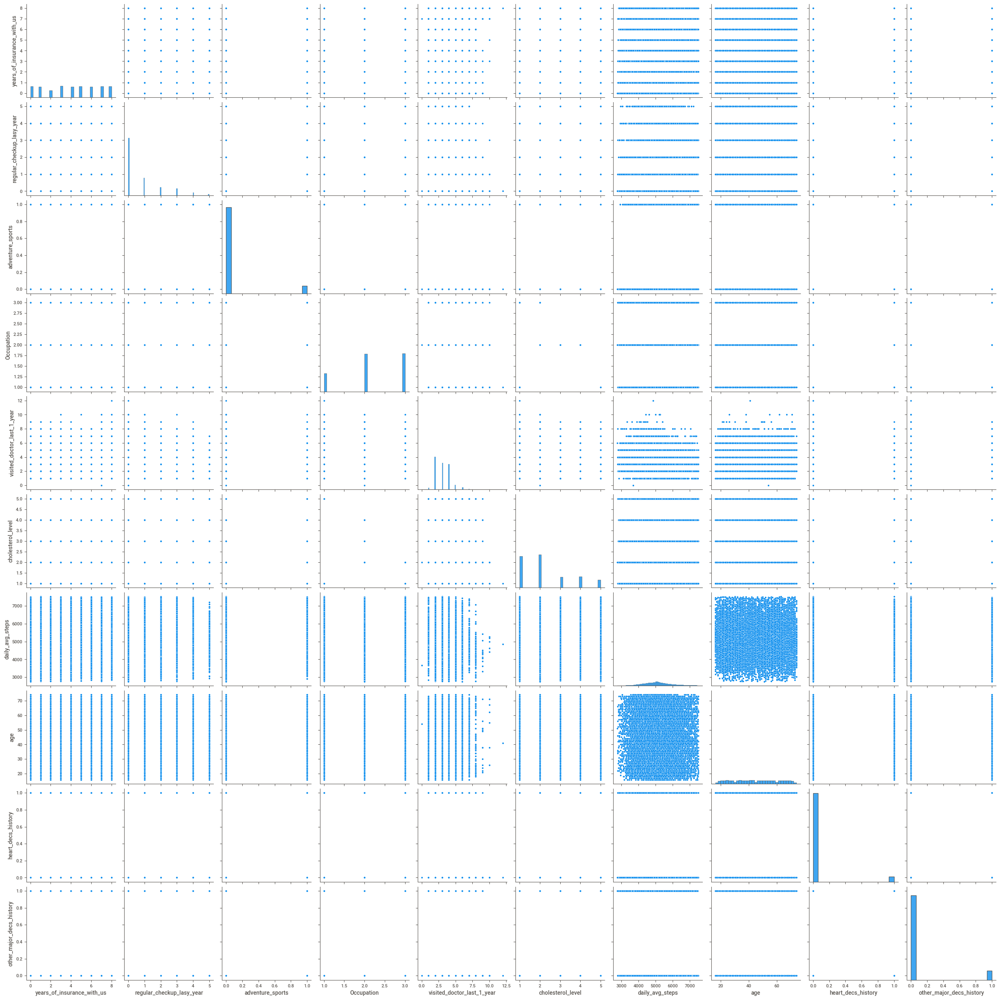

In [70]:
# Ploting the pairplot for columns 0 to 10
plt.figure()
cols_to_plot = health_imputed_df.columns[0:10].tolist() 
sns.pairplot(health_imputed_df[cols_to_plot])
plt.show()

<Figure size 600x400 with 0 Axes>

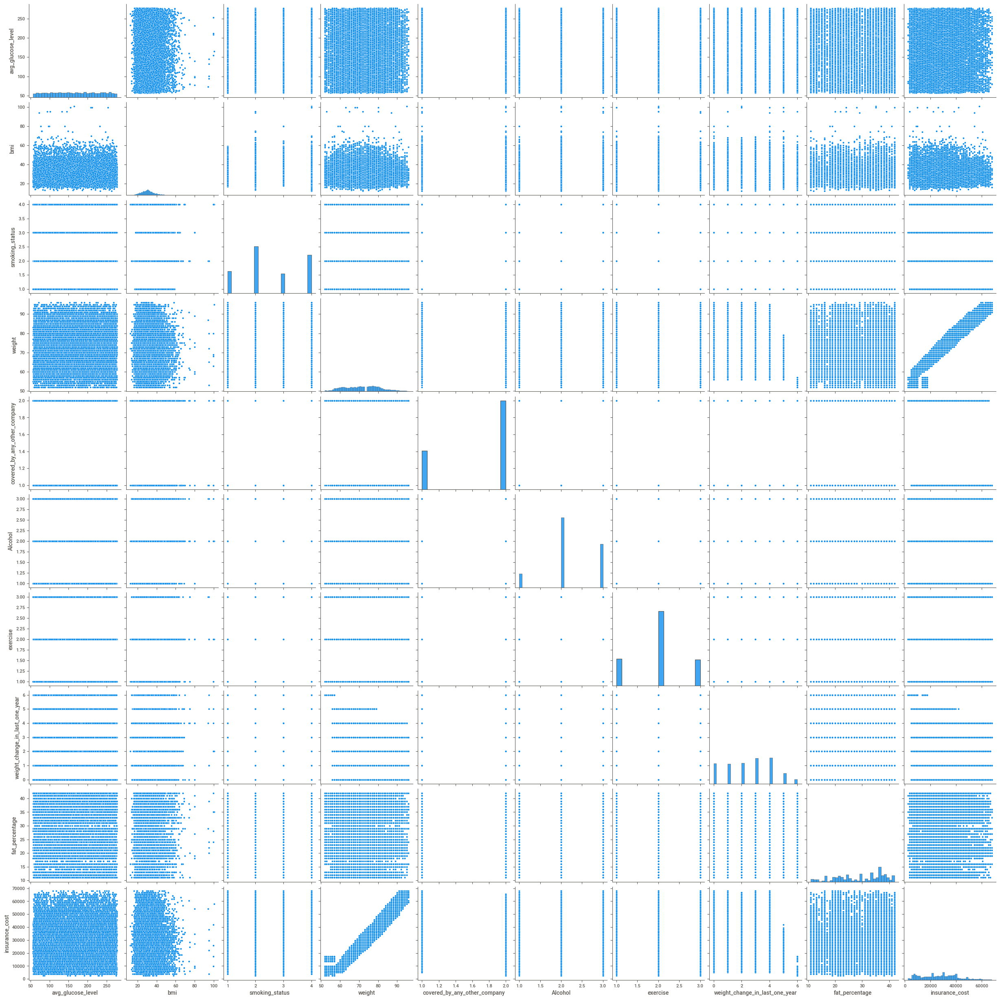

In [71]:
# Ploting the pairplot for columns 11 to 21
plt.figure()
cols_to_plot = health_imputed_df.columns[11:21].tolist() 
sns.pairplot(health_imputed_df[cols_to_plot])
plt.show()

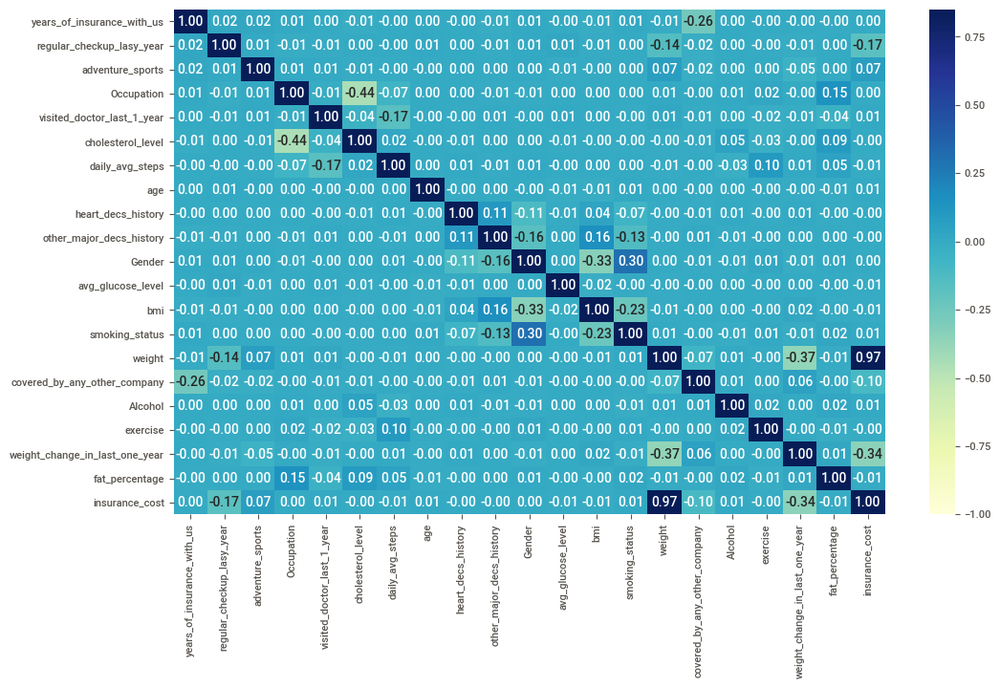

In [69]:
# Plotting the heatmap of correlation , deep blue means high correlation
plt.figure(figsize=(12,7))
sns.heatmap(health_imputed_df.corr(), annot=True, fmt='.2f', cmap='YlGnBu', vmax =.85, vmin=-1)
plt.show()

In [87]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [88]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["insurance_cost"] = df4.columns

In [89]:
vif_data["VIF"] = [variance_inflation_factor(df4.values, i)
                          for i in range(len(df4.columns))]
  
print(vif_data)

                    insurance_cost    VIF
0       years_of_insurance_with_us   3.69
1        regular_checkup_lasy_year   1.49
2                 adventure_sports   1.10
3                       Occupation  12.69
4       visited_doctor_last_1_year   8.53
5                cholesterol_level   5.39
6                  daily_avg_steps  36.82
7                              age   8.67
8               heart_decs_history   1.08
9         other_major_decs_history   1.17
10                          Gender  10.79
11               avg_glucose_level   8.06
12                             bmi  19.57
13                  smoking_status   7.42
14                          weight 262.42
15    covered_by_any_other_company  16.18
16                         Alcohol  13.49
17                        exercise  10.65
18  weight_change_in_last_one_year   3.60
19                  fat_percentage  12.83
20                  insurance_cost  28.05


In [91]:
vif_data.sort_values(by=['VIF'],ascending=False)

,insurance_cost,VIF
14,weight,262.42
6,daily_avg_steps,36.82
20,insurance_cost,28.05
12,bmi,19.57
15,covered_by_any_other_company,16.18
16,Alcohol,13.49
19,fat_percentage,12.83
3,Occupation,12.69
10,Gender,10.79
17,exercise,10.65


In [92]:
from sklearn.cluster import KMeans 

In [93]:
# Create K Means cluster and store the result in the object k_means
k_means = KMeans(n_clusters = 2,random_state=1)

In [94]:
wss =[] 

In [95]:
for i in range(1,11):
    KM = KMeans(n_clusters=i,random_state=1)
    KM.fit(df4)
    wss.append(KM.inertia_)

In [96]:
a=[1,2,3,4,5,6,7,8,9,10]

<AxesSubplot:>

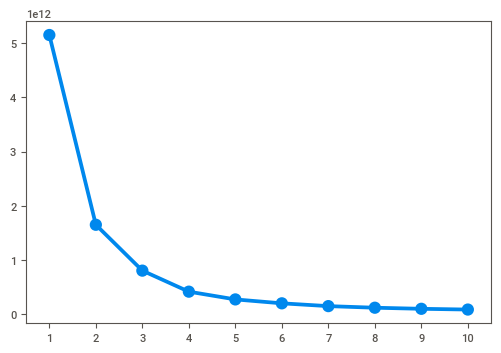

In [97]:
sns.pointplot(a, wss)

In [108]:
k_means = KMeans(n_clusters = 3,random_state=1)
k_means.fit(df4)
labels = k_means.labels_

In [109]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [110]:
silhouette_score(df4,labels,random_state=1)

0.573954504545471

In [111]:
df4["Clus_kmeans4"] = labels
df4.head()

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,...,bmi,smoking_status,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost,Clus_kmeans4
0,3.00,1.00,1.00,1.00,2.00,1.00,4866.00,28.00,1.00,0.00,...,31.20,4.00,67.00,2.00,2.00,2.00,1.00,25.00,20978.00,0
1,0.00,0.00,0.00,3.00,4.00,2.00,6411.00,50.00,0.00,0.00,...,34.20,1.00,58.00,2.00,2.00,2.00,3.00,27.00,6170.00,0
2,1.00,0.00,0.00,2.00,4.00,4.00,4509.00,68.00,0.00,0.00,...,40.40,1.00,73.00,2.00,1.00,1.00,0.00,32.00,28382.00,1
3,7.00,4.00,0.00,2.00,2.00,3.00,6214.00,51.00,0.00,0.00,...,22.90,4.00,71.00,1.00,2.00,3.00,3.00,37.00,27148.00,1
4,3.00,1.00,0.00,3.00,2.00,2.00,4938.00,44.00,0.00,1.00,...,26.50,2.00,74.00,2.00,3.00,1.00,0.00,34.00,29616.00,1


In [112]:
df4.Clus_kmeans4.value_counts().sort_index()

0    10074
1    11685
2     3241
Name: Clus_kmeans4, dtype: int64

In [113]:
clust_profile=df4
clust_profile=clust_profile.groupby('Clus_kmeans4').mean()
clust_profile['freq']=df4.Clus_kmeans4.value_counts().sort_index()
clust_profile

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,...,bmi,smoking_status,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost,freq
Clus_kmeans4,,,,,,,,,,,,,,,,,,,,,
0,4.09,0.96,0.06,2.22,3.10,2.26,5114.25,44.87,0.05,0.10,...,31.44,2.58,62.44,1.73,2.23,2.00,3.17,28.89,12971.82,10074
1,4.10,0.74,0.10,2.21,3.10,2.26,5113.95,44.89,0.05,0.10,...,31.38,2.59,75.39,1.69,2.24,1.99,2.10,28.78,32511.49,11685
2,4.03,0.31,0.10,2.22,3.12,2.28,5108.11,45.18,0.06,0.10,...,31.27,2.61,86.50,1.62,2.24,2.00,2.00,28.67,51869.88,3241
